<a href="https://colab.research.google.com/github/BernardoRicci/symbolic_deep_learning/blob/master/Discovering_Symbolic_Models_from_Deep_Learning_with_Inductive_Biases.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Discovering Symbolic Models from Deep Learning with Inductive Biases

Bernardo Ricci

[GitHub project](https://github.com/BernardoRicci/symbolic_deep_learning)

The task was to put into practice and modify the model suggested in the article '[Discovering Symbolic Models from Deep Learning with Inductive Biases](https://arxiv.org/abs/2006.11287)'.  The objective is to use an inductively biased GNN to derive a symbolic representation of the interaction between pairs of particles.
Simulations of systems of interacting particles are generated to create the dataset. Each event is saved as a graph, with each node representing a particle and its properties as features.
This GNN does Message Passing by aggregating the edges in an overall message, then, using a second MLP, it trains on the value of the accelerations. It does this by using the prior outputs from the first MLP to calculate the edges between pairs of nodes that hold the information on the interaction.
The inductive bias consists in treating the edges/messages as if they really represent the forces and is therefore imposed through the aggregation operation.
At the end we use the PySR package to perform the symbolic regression on the single interactions calculated by the first MLP.

Set 'RunColab = True' if you run this code in Google Colab, otherwise you should install 'julia' for the final part of the program [from the official site](https://julialang.org/downloads/)
(It is needed to use PySR).

IMPORTANT
Check to have GPU, otherwise: Runtime >> change Runtime type >> GPU

# SUMMARY

The project is divided as following:
- Required packages are installed;
- Data are generated with a simulation;
- An explanation of models used is provided;
- Dataset is prepared in Dataloader;
- Training is done;
- The training is analyzed;
- Symbolic regression: PySR is used to obtain analytical expression of the force;
- Conclusions and possible improvements.

# IMPORTANT PRELIMINARY PASSAGES - READ CAREFULLY

Set 'RunColab = True' if you run this code in Google Colab, otherwise you should install 'julia' for the final part of the program [from the official site](https://julialang.org/downloads/)
(It is needed to use PySR).

Check to have GPU, otherwise: Runtime >> change Runtime type >> GPU

In [ ]:
import torch
# Check to have GPU, otherwise change Runtime type
torch.ones(1).cuda()
RunColab = True

In [ ]:
%%capture
%%shell

set -e

#---------------------------------------------------#
JULIA_VERSION="1.8.5"
export JULIA_PKG_PRECOMPILE_AUTO=0
#---------------------------------------------------#

if [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  echo "Installing PyCall.jl..."
  julia -e 'using Pkg; Pkg.add("PyCall"); Pkg.build("PyCall")'
  julia -e 'println("Success")'

fi

In [ ]:
%pip install -Uq pysr pytorch_lightning

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import julia
from julia import Julia
if RunColab == False:
    julia.install()

julia = Julia(compiled_modules=False, threads='auto')
from julia import Main
from julia.tools import redirect_output_streams

redirect_output_streams()

[ Info: Julia version info


Julia Version 1.9.1
Commit 147bdf428cd (2023-06-07 08:27 UTC)
Platform Info:
  OS: Linux (x86_64-linux-gnu)
      Ubuntu 22.04.2 LTS
  uname: Linux 5.19.0-45-generic #46~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Wed Jun 7 15:06:04 UTC 20 x86_64 x86_64
  CPU: AMD Ryzen 7 5800H with Radeon Graphics: 
                 speed         user         nice          sys         idle          irq
       #1-16  3257 MHz     124155 s        113 s      31626 s    2780032 s          0 s
  Memory: 13.496692657470703 GB (6063.95703125 MB free)
  Uptime: 18552.91 sec
  Load Avg:  1.36  1.17  1.23
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, znver3)
  Threads: 1 on 16 virtual cores
Environment:
  MATHEMATICA_HOME = /usr/local/Wolfram/Mathematica/13.0
  HOME = /home/bernardo
  SNAP_LIBRARY_PATH = /var/lib/snapd/lib/gl:/var/lib/snapd/lib/gl32:/var/lib/snapd/void
  MANDATORY_PATH = /usr/share/gconf/ubuntu.mandatory.path
  DEFAULTS_PATH = /usr/share/gconf/ubuntu.default.path
  TERM = xterm-col

[ Info: Julia executable: /snap/julia/80/bin/julia
[ Info: Trying to import PyCall...
┌ Info: PyCall is already installed and compatible with Python executable.
│ 
│ PyCall:
│     python: /bin/python3
│     libpython: /usr/lib/x86_64-linux-gnu/libpython3.10.so.1.0
│ Python:
│     python: /bin/python3
└     libpython: 


# Data Generation

## Import packages

In [ ]:
import numpy as np
import pandas as pd
import os
import torch
from torch.autograd import Variable
from tqdm import tqdm
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.integrate import odeint
from copy import deepcopy as copy
from IPython.display import HTML
from scipy.optimize import minimize

In [ ]:
!pip install celluloid
version_nums = torch.__version__.split('.')
version_nums[-1] = '0' + version_nums[-1][1:]
os.environ['TORCH'] = '.'.join(version_nums)
!pip install --upgrade torch-scatter -f https://pytorch-geometric.com/whl/torch-${TORCH}.html && pip install --upgrade torch-sparse -f https://pytorch-geometric.com/whl/torch-${TORCH}.html && pip install --upgrade torch-geometric


from celluloid import Camera
from torch import nn
from torch.functional import F
from torch.optim import Adam
from torch_geometric.nn import MetaLayer, MessagePassing
from torch_geometric.data import Data, DataLoader

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Looking in links: https://pytorch-geometric.com/whl/torch-1.13.0+cu117.html
Defaulting to user installation because normal site-packages is not writeable
Looking in links: https://pytorch-geometric.com/whl/torch-1.13.0+cu117.html
Defaulting to user installation because normal site-packages is not writeable


Download of the files:

- simulation.py: contains the code for simulations
- models.py: contains the code with GNN models


In [ ]:
!wget https://raw.githubusercontent.com/BernardoRicci/symbolic_deep_learning/master/models.py -O models.py
!wget https://raw.githubusercontent.com/BernardoRicci/symbolic_deep_learning/master/simulate.py -O simulate.py

import models
import simulate

--2023-06-25 15:47:12--  https://raw.githubusercontent.com/BernardoRicci/symbolic_deep_learning/master/models.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13860 (14K) [text/plain]
Saving to: ‘models.py’

models.py           100%[===================>]  13,54K  --.-KB/s    in 0,01s   

2023-06-25 15:47:13 (1,35 MB/s) - ‘models.py’ saved [13860/13860]

--2023-06-25 15:47:13--  https://raw.githubusercontent.com/BernardoRicci/symbolic_deep_learning/master/simulate.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9879 (9,6K) [te

## Create the simulation

Let's generate $n_s$ simulations of a particle system that evolves over time by choosing the interaction potential and saving at every instant some features for each particle with the individual acceleration components. Each particle is associated with a node of the graph, with $n_{features}$ features.
The acceleration values ​​of each particle are used as a label to train the net.


In [ ]:
# Number of simulations to run
ns = 10000
# Potential (see below for options)
sim = 'spring'
# Number of nodes
n = 4
# Dimension
dim = 2
# Number of time steps
nt = 1000

#Standard simulation sets:
n_set = [4, 8]
sim_sets = [
 {'sim': 'r1', 'dt': [5e-3], 'nt': [1000], 'n': n_set, 'dim': [2, 3]},
 {'sim': 'r2', 'dt': [1e-3], 'nt': [1000], 'n': n_set, 'dim': [2, 3]},
 {'sim': 'spring', 'dt': [1e-2], 'nt': [1000], 'n': n_set, 'dim': [2, 3]},
 {'sim': 'charge', 'dt': [1e-3], 'nt': [1000], 'n': n_set, 'dim': [2, 3]}
]

#Select the hand-tuned dt value for a smooth simulation
# (since scales are different in each potential):
dt = [ss['dt'][0] for ss in sim_sets if ss['sim'] == sim][0]

title = '{}_n={}_dim={}_nt={}_dt={}'.format(sim, n, dim, nt, dt)
print('Running on', title)

Running on spring_n=4_dim=2_nt=1000_dt=0.01


In [ ]:
from simulate import SimulationDataset
s = SimulationDataset(sim, n=n, dim=dim, nt=nt//2, dt=dt)
base_str = './'
data_str = title
s.simulate(ns)

data = s.data
s.data.shape

(10000, 500, 4, 6)

Plot of a simulation example.

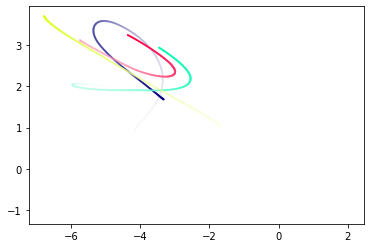

In [ ]:
s.plot(0, animate=True, plot_size=False)

## Dataset preparation

Let's generate the dataset remembering that the goal is to train on the accelerations

In [ ]:
accel_data = s.get_acceleration()
X = torch.from_numpy(np.concatenate([s.data[:, i] for i in range(0, s.data.shape[1], 5)]))
y = torch.from_numpy(np.concatenate([accel_data[:, i] for i in range(0, s.data.shape[1], 5)]))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)

# Used Models:

The network used is a custom GNN (see models.py) where:

A first MLP takes as input the pairs of nodes of the graph, has three hidden layers of 300 neurons and gives in output the message between the two nodes. I want that the returned message represents the interaction between the nodes. To do this I have experimented different methods:

- "Bottleneck" model, a GNN in which the dimension of the output will have a dimension equal to that in which the particles live;

- "L1" model, a GNN with the output of 100 messages components and a L1 regularization loss term on the messages;

- "KL" model, same of "L1" with the Kullback-Leibler (KL) regularization;

- "PM" model, composed of 5 consecutive linear layers of 300, 450, 600, 450, 300 neurons and an outgoing message of 100 messages components, with L1 regularization;

- "CUSTOM" model, denoting with $X$ the output of the 1st linear dense layer, 2 independent linear layers are then instantiated to respectively perform linear transformations over $\frac{1}{1+ReLU(X)}$ and $\frac{1}{(1+ReLU(X))^2}$,  where the unit is added to avoid 0 division errors. Also this has an output of 100 messages components and L1 regularization.


For each of this model I can apply three different losses:
 - Mean Squared Error (MSE);
 - Mean Absolute Error (MAE);
 - Huber Loss (HUBER);

In [ ]:
from models import make_packer, make_unpacker, get_edge_index, OGN, varOGN, PM_GN, CUST_GN
edge_index = get_edge_index(n, sim)

## Hyperparameters:

In [ ]:
class HP:
  def __init__(self, n_feat, model_type, loss_type = 'MAE', reg = 'without_reg', aggr = 'add', hidden_dim = 300, msg_dim = 100, out_dim = 2):
    self.model_type = model_type       # model_type = 'Bottleneck', 'L1', 'KL', 'PM', 'CUST'
    self.n_f = n_feat
    self.reg = reg
    self.loss_type = loss_type         # loss_type = 'MSE', 'MAE', 'HUBER'
    self.aggr = aggr
    self.hidden_dim = hidden_dim
    self.msg_dim = msg_dim
    self.dim = out_dim

    if self.model_type == 'Bottleneck':
      self.msg_dim = 2
    elif self.model_type == 'L1':
      self.reg = 'L1'
      self.msg_dim = 100
    elif self.model_type == 'KL':
      self.reg = 'KL'
      self.msg_dim = 100
    elif self.model_type == 'PM':
      self.reg = 'L1'
      self.msg_dim = 100
    elif self.model_type == 'CUST':
      self.reg = 'L1'
      self.msg_dim = 100

### Here you can modify 'model_type' and 'loss_type' to personalize your training

In [ ]:
mod = HP(n_feat = data.shape[3], model_type = 'CUST', loss_type = 'HUBER')


In [ ]:
if mod.model_type == 'PM':
  ogn = PM_GN(mod.n_f, mod.msg_dim, mod.dim, dt=0.1, hidden=mod.hidden_dim, edge_index=get_edge_index(n, sim), aggr=mod.aggr).cuda()
elif mod.model_type == 'CUST':
  ogn = CUST_GN(mod.n_f, mod.msg_dim, mod.dim, dt=0.1, hidden=mod.hidden_dim, edge_index=get_edge_index(n, sim), aggr=mod.aggr).cuda()
elif mod.model_type == 'KL':
  ogn = varOGN(mod.n_f, mod.msg_dim, mod.dim, dt=0.1, hidden=mod.hidden_dim, edge_index=get_edge_index(n, sim), aggr=mod.aggr).cuda()
elif mod.model_type == 'Bottleneck' or mod.model_type == 'L1':
  ogn = OGN(mod.n_f, mod.msg_dim, mod.dim, dt=0.1, hidden=mod.hidden_dim, edge_index=get_edge_index(n, sim), aggr=mod.aggr).cuda()
else:
  raise NotImplementedError("'model_type' choosen doesn't exist!")


messages_over_time = []
ogn=ogn.cuda()

# Set up the training

## Dataloader

Let's organize into data loader creating mini-batches of graphs

In [ ]:
batch =  int(64 * (4 / n)**2) # = 64 for n=4
trainloader = DataLoader(
    [Data(
        Variable(X_train[i]),
        edge_index=edge_index,
        y=Variable(y_train[i])) for i in range(len(y_train))],
    batch_size=batch,
    shuffle=True
)

testloader = DataLoader(
    [Data(
        X_test[i],
        edge_index=edge_index,
        y=y_test[i]) for i in range(len(y_test))],
    batch_size=1024,
    shuffle=True
)

validationloader = DataLoader(
    [Data(
        X_val[i],
        edge_index=edge_index,
        y=y_val[i]) for i in range(len(y_val))],
    batch_size=batch,
    shuffle=True
)

/home/bernardo/.local/lib/python3.10/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


## Losses and Regularizations:

The final loss is MSE, MAE, or HUBER summed up with the regularization, L1 or KL (or nothing in the case of Bottleneck).

In [ ]:
def new_loss(gn, g, m, augment=True):
    base_loss =gn.loss(g, m.loss_type)
    #Here is calculated the message between couple of nodes
    s1 = g.x[gn.edge_index[0]]
    s2 = g.x[gn.edge_index[1]]
    if m.reg == 'L1':
      m12 = gn.message(s1, s2)
      regularization = 1e-2
      #Loss is summed over all batch, I want one loss value per row of g.y
      normalized_l05 = torch.sum(torch.abs(m12))
      return base_loss + regularization * batch * normalized_l05 / n**2 * n
    if m.reg == 'KL':
      regularization = 1
      #Want one loss value per row of g.y
      tmp = torch.cat([s1, s2], dim=1)
      raw_msg = gn.msg_fnc(tmp)
      mu = raw_msg[:, 0::2]
      logvar = raw_msg[:, 1::2]
      full_kl = torch.sum(torch.exp(logvar) + mu**2 - logvar)/2.0
      return base_loss + regularization * batch * full_kl / n**2 * n

    else:
      return base_loss

Let's define the initial learning rate and the ADAM optimizer.
[OneCycleLR](https://pytorch.org/docs/stable/generated/torch.optim.lr_scheduler.OneCycleLR.html) reduces learning rate according to the 1cycle learning rate policy.
In contrast to many other learning rate schedulers, the learning rate is not only decreased over the training process. Instead, the learning rate increases from an initial learning rate to some maximum learning rate and then decreases again.

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

init_lr = 1e-3

opt = torch.optim.Adam(ogn.parameters(), lr=init_lr, weight_decay=1e-8)

total_epochs = 100

batch_per_epoch = int(1000*10 / (batch/32.0))

sched = OneCycleLR(opt, max_lr=init_lr,
                   steps_per_epoch=len(trainloader),
                   epochs=total_epochs, final_div_factor=1e5)


batch_per_epoch

epoch = 0

Run = f"{sim}_{mod.model_type}_{mod.loss_type}"


## Organize the recording of messages over time
This is for fitting the forces, and extracting laws.

On this set are calculated the messages to export (with 'get_messages' function):

In [ ]:
np.random.seed(0)
test_idxes = np.random.randint(0, len(X_test), 1000)

#Record messages over test dataset here:
newtestloader = DataLoader(
    [Data(
        X_test[i],
        edge_index=edge_index,
        y=y_test[i]) for i in test_idxes],
    batch_size=len(X_test),
    shuffle=False
)

## Record messages from model
'get_messages' calculate the messages, to save them together with the relative distances between two nodes.

In [ ]:
def get_messages(ogn, m):

    def get_message_info(tmp, m):
        ogn.cpu()

        s1 = tmp.x[tmp.edge_index[0]]
        s2 = tmp.x[tmp.edge_index[1]]
        tmp = torch.cat([s1, s2], dim=1)
        if m.reg == 'KL':
            raw_msg = ogn.msg_fnc(tmp)
            mu = raw_msg[:, 0::2]
            logvar = raw_msg[:, 1::2]

            m12 = mu
        else:
            m12 = ogn.msg_fnc(tmp)

        all_messages = torch.cat((
            s1,
            s2,
            m12), dim=1)
        if dim == 2:
            columns = [elem%(k) for k in range(1, 3) for elem in 'x%d y%d vx%d vy%d q%d m%d'.split(' ')]
            columns += ['e%d'%(k,) for k in range(m.msg_dim)]
        elif dim == 3:
            columns = [elem%(k) for k in range(1, 3) for elem in 'x%d y%d z%d vx%d vy%d vz%d q%d m%d'.split(' ')]
            columns += ['e%d'%(k,) for k in range(m.msg_dim)]


        return pd.DataFrame(
            data=all_messages.cpu().detach().numpy(),
            columns=columns
        )

    msg_info = []
    for i, g in enumerate(newtestloader):
        msg_info.append(get_message_info(g, m))

    msg_info = pd.concat(msg_info)
    msg_info['dx'] = msg_info.x1 - msg_info.x2
    msg_info['dy'] = msg_info.y1 - msg_info.y2
    if dim == 2:
        msg_info['r'] = np.sqrt(
            (msg_info.dx)**2 + (msg_info.dy)**2
        )
    elif dim == 3:
        msg_info['dz'] = msg_info.z1 - msg_info.z2
        msg_info['r'] = np.sqrt(
            (msg_info.dx)**2 + (msg_info.dy)**2 + (msg_info.dz)**2
        )

    return msg_info

In [ ]:
recorded_models = []

## Training Loop

So let's resume all the hyperparameters and characteristics of the model that is going to be trained

In [ ]:
print('Model:',mod.model_type)
print('Loss:',mod.loss_type)
print('ogn:',ogn)
print('Regularization:',mod.reg,'\n')
print('# features:',mod.n_f)
print('Total epochs:',total_epochs)
print('Simulation:',sim)
print('Nodes (particles in simulation):',n)
print('# Simulations:',ns)
print('Dimension:',dim)
print('Batch:',batch)

Model: CUST
Loss: HUBER
ogn: CUST_GN()
Regularization: L1 

# features: 6
Total epochs: 100
Simulation: spring
Nodes (particles in simulation): 4
# Simulations: 10000
Dimension: 2
Batch: 64


In [ ]:
t_loss = []
t_val_loss = []

In [ ]:
for epoch in tqdm(range(epoch, total_epochs)):
    ogn.cuda()
    tot_loss = 0.0
    tot_val_loss = 0.0
    num_items = 0
    num_items_vali = 0
    #Training
    for ginput in trainloader:
        opt.zero_grad()
        ginput.x = ginput.x.cuda()
        ginput.y = ginput.y.cuda()
        ginput.edge_index = ginput.edge_index.cuda()
        ginput.batch = ginput.batch.cuda()
        loss = new_loss(ogn, ginput, mod)
        (loss/int(ginput.batch[-1]+1)).backward()
        opt.step()
        sched.step()

        tot_loss += loss.item()
        num_items += int(ginput.batch[-1]+1)

    #Validation (no backward propagation)
    for ginput in validationloader:
        ginput.x = ginput.x.cuda()
        ginput.y = ginput.y.cuda()
        ginput.edge_index = ginput.edge_index.cuda()
        ginput.batch = ginput.batch.cuda()
        vali_loss = new_loss(ogn, ginput, mod)
        tot_val_loss += vali_loss.item()
        num_items_vali += int(ginput.batch[-1]+1)

    #Saving all informations
    loss_ = tot_loss/num_items
    t_loss.append(loss_)

    val_loss_ = tot_val_loss / num_items_vali
    t_val_loss.append(val_loss_)

    cur_msgs = get_messages(ogn, mod)
    cur_msgs['epoch'] = epoch
    cur_msgs['loss'] = loss_
    cur_msgs['val_loss'] = val_loss_
    messages_over_time.append(cur_msgs)
    recorded_models.append(ogn.state_dict())

    print("loss:", loss_, "valid. loss:", val_loss_)

  1%|          | 1/100 [01:46<2:55:47, 106.54s/it]

loss: 10.918322052526474 valid. loss: 8.819935461235046


  2%|▏         | 2/100 [02:48<2:10:55, 80.16s/it] 

loss: 8.556229683589935 valid. loss: 8.482491635322571


  3%|▎         | 3/100 [03:49<1:56:00, 71.76s/it]

loss: 7.712284677505493 valid. loss: 7.1519199680328365


  4%|▍         | 4/100 [04:52<1:48:43, 67.95s/it]

loss: 6.9614722149848935 valid. loss: 6.21881123418808


  5%|▌         | 5/100 [05:54<1:44:09, 65.79s/it]

loss: 5.882436590456963 valid. loss: 5.157590006542206


  6%|▌         | 6/100 [06:55<1:40:48, 64.35s/it]

loss: 4.820731448507309 valid. loss: 4.5249193006515505


  7%|▋         | 7/100 [07:57<1:38:31, 63.57s/it]

loss: 4.125374772548676 valid. loss: 4.701898264694214


  8%|▊         | 8/100 [09:02<1:38:07, 64.00s/it]

loss: 3.4917213667154314 valid. loss: 2.5909734775066378


  9%|▉         | 9/100 [10:09<1:38:16, 64.80s/it]

loss: 2.8958132364213465 valid. loss: 2.2820249886989594


 10%|█         | 10/100 [11:13<1:37:08, 64.76s/it]

loss: 2.4798100581884386 valid. loss: 3.370186483001709


 11%|█         | 11/100 [12:15<1:34:50, 63.94s/it]

loss: 2.286212277033925 valid. loss: 2.839502839756012


 12%|█▏        | 12/100 [13:17<1:32:53, 63.33s/it]

loss: 2.1237693574100733 valid. loss: 1.9017321372509002


 13%|█▎        | 13/100 [14:19<1:31:09, 62.87s/it]

loss: 1.9089092686474323 valid. loss: 1.4365989044189453


 14%|█▍        | 14/100 [15:21<1:29:51, 62.69s/it]

loss: 1.8814164209872484 valid. loss: 1.4349905583143234


 15%|█▌        | 15/100 [16:26<1:29:32, 63.20s/it]

loss: 1.7977037906616926 valid. loss: 1.2728510226011276


 16%|█▌        | 16/100 [17:32<1:29:35, 63.99s/it]

loss: 1.865223004102707 valid. loss: 1.4785942123889924


 17%|█▋        | 17/100 [18:37<1:29:11, 64.48s/it]

loss: 1.7895478087902068 valid. loss: 1.6544740106344222


 18%|█▊        | 18/100 [19:41<1:27:54, 64.33s/it]

loss: 1.7677835453450679 valid. loss: 1.9287911262989044


 19%|█▉        | 19/100 [20:43<1:25:44, 63.52s/it]

loss: 1.7863161455750465 valid. loss: 1.465222607922554


 20%|██        | 20/100 [21:45<1:24:08, 63.10s/it]

loss: 1.6722011959075929 valid. loss: 1.5304966072320938


 21%|██        | 21/100 [22:47<1:22:45, 62.85s/it]

loss: 1.6899922014057636 valid. loss: 1.543567155122757


 22%|██▏       | 22/100 [23:49<1:21:20, 62.57s/it]

loss: 1.67140348418355 valid. loss: 1.3887865701675415


 23%|██▎       | 23/100 [24:52<1:20:22, 62.63s/it]

loss: 1.6015420074760913 valid. loss: 2.525322337651253


 24%|██▍       | 24/100 [25:55<1:19:26, 62.71s/it]

loss: 1.5843548919171095 valid. loss: 3.0592430649757385


 25%|██▌       | 25/100 [26:56<1:17:55, 62.34s/it]

loss: 1.5095998792976142 valid. loss: 1.1169624497294426


 26%|██▌       | 26/100 [28:02<1:18:10, 63.38s/it]

loss: 1.4698381257027389 valid. loss: 1.1916141948223113


 27%|██▋       | 27/100 [29:10<1:18:57, 64.89s/it]

loss: 1.4228488824248313 valid. loss: 1.1685668985128403


 28%|██▊       | 28/100 [30:18<1:18:40, 65.56s/it]

loss: 1.380293599331379 valid. loss: 0.9215481858253479


 29%|██▉       | 29/100 [31:23<1:17:39, 65.62s/it]

loss: 1.3295822820812464 valid. loss: 1.4175893904447556


 30%|███       | 30/100 [32:28<1:16:14, 65.35s/it]

loss: 1.2988175624847411 valid. loss: 1.7044765602111815


 31%|███       | 31/100 [33:32<1:14:48, 65.04s/it]

loss: 1.2303195698916911 valid. loss: 0.9691721481919289


 32%|███▏      | 32/100 [34:37<1:13:36, 64.95s/it]

loss: 1.1916293371886015 valid. loss: 1.549936496400833


 33%|███▎      | 33/100 [35:46<1:13:46, 66.06s/it]

loss: 1.1465032705634832 valid. loss: 0.8088669861316681


 34%|███▍      | 34/100 [36:54<1:13:19, 66.65s/it]

loss: 1.127242075520754 valid. loss: 1.4919237637519835


 35%|███▌      | 35/100 [37:57<1:11:07, 65.65s/it]

loss: 1.103578190240264 valid. loss: 1.0566211771965026


 36%|███▌      | 36/100 [39:01<1:09:19, 64.99s/it]

loss: 1.039412552806735 valid. loss: 1.3667814926624298


 37%|███▋      | 37/100 [40:01<1:06:53, 63.71s/it]

loss: 0.9871646586179733 valid. loss: 0.7836577942371369


 38%|███▊      | 38/100 [40:57<1:03:25, 61.38s/it]

loss: 0.9630320252090693 valid. loss: 0.8155992101073265


 39%|███▉      | 39/100 [41:54<1:00:58, 59.98s/it]

loss: 0.9393982371032238 valid. loss: 0.8934832419633866


 40%|████      | 40/100 [42:50<58:45, 58.77s/it]  

loss: 0.9190903199076652 valid. loss: 0.7973881689310074


 41%|████      | 41/100 [43:48<57:41, 58.67s/it]

loss: 0.9114521643221378 valid. loss: 0.8657030822873115


 42%|████▏     | 42/100 [44:45<56:10, 58.11s/it]

loss: 0.8429303566455841 valid. loss: 0.6994004710316658


 43%|████▎     | 43/100 [45:41<54:38, 57.52s/it]

loss: 0.8307501168072223 valid. loss: 0.750542023217678


 44%|████▍     | 44/100 [46:38<53:22, 57.19s/it]

loss: 0.8093834349676967 valid. loss: 0.6498968595862389


 45%|████▌     | 45/100 [47:34<52:10, 56.92s/it]

loss: 0.786589966891706 valid. loss: 0.6207892213881016


 46%|████▌     | 46/100 [48:30<50:58, 56.64s/it]

loss: 0.7690643175721169 valid. loss: 0.6344925203859806


 47%|████▋     | 47/100 [49:26<49:57, 56.55s/it]

loss: 0.7480720111489296 valid. loss: 0.6994619323730469


 48%|████▊     | 48/100 [50:23<49:01, 56.58s/it]

loss: 0.7272372109293938 valid. loss: 0.6408885341405869


 49%|████▉     | 49/100 [51:19<47:59, 56.46s/it]

loss: 0.6981386200532317 valid. loss: 0.7599749247431755


 50%|█████     | 50/100 [52:16<47:10, 56.60s/it]

loss: 0.6876621921241284 valid. loss: 0.6073255878210068


 51%|█████     | 51/100 [53:12<46:08, 56.51s/it]

loss: 0.6524741203069687 valid. loss: 0.5746633830785751


 52%|█████▏    | 52/100 [54:08<45:06, 56.38s/it]

loss: 0.6481335121944547 valid. loss: 0.5938918173193931


 53%|█████▎    | 53/100 [55:04<43:52, 56.02s/it]

loss: 0.621496751601994 valid. loss: 0.7737854543089867


 54%|█████▍    | 54/100 [56:00<42:55, 55.98s/it]

loss: 0.6103017399832606 valid. loss: 0.5092478268802166


 55%|█████▌    | 55/100 [56:56<42:04, 56.10s/it]

loss: 0.5885044443920254 valid. loss: 0.6037663227975368


 56%|█████▌    | 56/100 [57:52<41:07, 56.07s/it]

loss: 0.5787424679338932 valid. loss: 0.591341866594553


 57%|█████▋    | 57/100 [58:48<40:10, 56.06s/it]

loss: 0.5631849504083395 valid. loss: 0.5687309354364872


 58%|█████▊    | 58/100 [59:43<39:07, 55.89s/it]

loss: 0.5451478137508035 valid. loss: 0.5868380307555199


 59%|█████▉    | 59/100 [1:00:39<38:10, 55.87s/it]

loss: 0.5338059066325426 valid. loss: 0.6139656001925469


 60%|██████    | 60/100 [1:01:35<37:13, 55.85s/it]

loss: 0.5083149874761701 valid. loss: 0.49694096547961236


 61%|██████    | 61/100 [1:02:41<38:17, 58.91s/it]

loss: 0.4959951752409339 valid. loss: 0.4845120421767235


 62%|██████▏   | 62/100 [1:03:54<39:53, 62.97s/it]

loss: 0.48000160618722437 valid. loss: 0.4231998330175877


 63%|██████▎   | 63/100 [1:05:04<40:14, 65.27s/it]

loss: 0.46060478641539815 valid. loss: 0.513513339817524


 64%|██████▍   | 64/100 [1:06:16<40:19, 67.21s/it]

loss: 0.45459300385713575 valid. loss: 0.4044252349317074


 65%|██████▌   | 65/100 [1:07:32<40:49, 69.98s/it]

loss: 0.4370033565565944 valid. loss: 0.5297214408934117


 66%|██████▌   | 66/100 [1:08:45<40:10, 70.88s/it]

loss: 0.4199848663687706 valid. loss: 0.42509914025068285


 67%|██████▋   | 67/100 [1:10:01<39:50, 72.44s/it]

loss: 0.40740857724547386 valid. loss: 0.3818408083975315


 68%|██████▊   | 68/100 [1:11:15<38:47, 72.72s/it]

loss: 0.39379384201169015 valid. loss: 0.5281084776103496


 69%|██████▉   | 69/100 [1:12:28<37:39, 72.88s/it]

loss: 0.3800935188546777 valid. loss: 0.5550098540246486


 70%|███████   | 70/100 [1:13:40<36:22, 72.75s/it]

loss: 0.3651588550314307 valid. loss: 0.37799256199598313


 71%|███████   | 71/100 [1:14:56<35:33, 73.58s/it]

loss: 0.35804073755815624 valid. loss: 0.35390945670604707


 72%|███████▏  | 72/100 [1:16:16<35:10, 75.36s/it]

loss: 0.3426804829418659 valid. loss: 0.39471515677571295


 73%|███████▎  | 73/100 [1:17:29<33:40, 74.83s/it]

loss: 0.3321804848536849 valid. loss: 0.3028924657225609


 74%|███████▍  | 74/100 [1:18:43<32:16, 74.48s/it]

loss: 0.3205231686063111 valid. loss: 0.3587314918458462


 75%|███████▌  | 75/100 [1:19:56<30:53, 74.13s/it]

loss: 0.30976855144426224 valid. loss: 0.3146570596754551


 76%|███████▌  | 76/100 [1:21:09<29:27, 73.64s/it]

loss: 0.2984130187474191 valid. loss: 0.28056690592467787


 77%|███████▋  | 77/100 [1:22:25<28:31, 74.40s/it]

loss: 0.2875714107640088 valid. loss: 0.27853276377916336


 78%|███████▊  | 78/100 [1:23:38<27:09, 74.07s/it]

loss: 0.2799417593806982 valid. loss: 0.26163796996474264


 79%|███████▉  | 79/100 [1:24:53<26:00, 74.29s/it]

loss: 0.27089386988282205 valid. loss: 0.35721562938094137


 80%|████████  | 80/100 [1:26:06<24:40, 74.04s/it]

loss: 0.26007581623494624 valid. loss: 0.2601000516116619


 81%|████████  | 81/100 [1:27:22<23:34, 74.44s/it]

loss: 0.25337123934924605 valid. loss: 0.2522571965277195


 82%|████████▏ | 82/100 [1:28:37<22:25, 74.73s/it]

loss: 0.24510373649671674 valid. loss: 0.24733836010992527


 83%|████████▎ | 83/100 [1:29:54<21:20, 75.32s/it]

loss: 0.23766290301457046 valid. loss: 0.24138270359039307


 84%|████████▍ | 84/100 [1:31:09<20:02, 75.15s/it]

loss: 0.23074117527157068 valid. loss: 0.23798751232922077


 85%|████████▌ | 85/100 [1:32:32<19:25, 77.72s/it]

loss: 0.2244387657493353 valid. loss: 0.23097172856330872


 86%|████████▌ | 86/100 [1:34:31<21:00, 90.04s/it]

loss: 0.21844130507707596 valid. loss: 0.22401637088954449


 87%|████████▋ | 87/100 [1:36:27<21:11, 97.79s/it]

loss: 0.21255821893140672 valid. loss: 0.22377352941036224


 88%|████████▊ | 88/100 [1:38:21<20:32, 102.71s/it]

loss: 0.20786230931282043 valid. loss: 0.21482364817559718


 89%|████████▉ | 89/100 [1:40:05<18:54, 103.11s/it]

loss: 0.20283866727650166 valid. loss: 0.21005598645210266


 90%|█████████ | 90/100 [1:41:51<17:20, 104.05s/it]

loss: 0.1988740287490189 valid. loss: 0.2080135604530573


 91%|█████████ | 91/100 [1:43:35<15:36, 104.05s/it]

loss: 0.19513634212091566 valid. loss: 0.20269538275003432


 92%|█████████▏| 92/100 [1:45:21<13:56, 104.61s/it]

loss: 0.19152743774876 valid. loss: 0.199328629308939


 93%|█████████▎| 93/100 [1:47:13<12:27, 106.84s/it]

loss: 0.18870349957346916 valid. loss: 0.19548886849284172


 94%|█████████▍| 94/100 [1:48:34<09:53, 98.97s/it] 

loss: 0.18627392835095524 valid. loss: 0.19663011341392994


 95%|█████████▌| 95/100 [1:49:36<07:19, 87.95s/it]

loss: 0.1840400341235101 valid. loss: 0.1945217526167631


 96%|█████████▌| 96/100 [1:50:39<05:21, 80.36s/it]

loss: 0.18207700236439706 valid. loss: 0.19264125677347183


 97%|█████████▋| 97/100 [1:51:42<03:45, 75.29s/it]

loss: 0.18060153774470092 valid. loss: 0.1909207660496235


 98%|█████████▊| 98/100 [1:52:45<02:23, 71.62s/it]

loss: 0.17942411275804043 valid. loss: 0.19098024940788746


 99%|█████████▉| 99/100 [1:53:55<01:11, 71.04s/it]

loss: 0.17860551402643324 valid. loss: 0.19027809729576112


100%|██████████| 100/100 [1:54:57<00:00, 68.98s/it]

loss: 0.17840925796106458 valid. loss: 0.19019722303450107


# Analyze Trained Model

## Best Model
Let's take the model with the lowest validation loss.

In [ ]:
best_val = np.argmin(t_val_loss)
best_model = recorded_models[best_val]
ogn.load_state_dict(best_model)

<All keys matched successfully>

Let's see the behaviour of the training and validation along the epochs

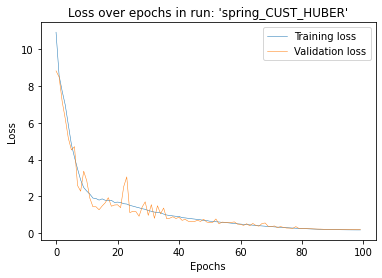

In [ ]:
fig, ax = plt.subplots()
ax.plot(range(len(t_loss)), t_loss, lw = 0.5, label="Training loss")
ax.plot(range(len(t_val_loss)), t_val_loss, lw = 0.5, label = "Validation loss")
ax.set_title(f"Loss over epochs in run: '{Run}'")
ax.set_ylabel("Loss")
ax.set_xlabel("Epochs")
plt.legend()
plt.savefig(Run + '_loss.png')
plt.savefig(Run + '_loss.jpeg')
plt.savefig(Run + '_loss.pdf')

## Almost Correct Predictions Error Rate (ACPER) and Almost Correct Predictions Correct Rate (ACPCR)

I wanna check how good my predictions are respect to the true values. So I used the ACPER and the ACPCR.

The ACPCR is the percentage of predictions that is in a certain percentage (treshold) of the true value. It’s about setting an arbitrary range in which values fall in. All of those values contribute to calculating ACPCR.
Essentially, is 1-ACPER (Almost Correct Predictions Error Rate).
The ACPER is the the percentage of predictions that is out of a certain percentage of the true value.

Highest the ACPCR, better the training over the simulation. The opposite for the ACPER.


For this work I assumed a treshold of 2% over the true value.

In [ ]:
def ACPCR(gn, dataloader):
    num_batch = 0
    total_acpcr = 0
    th = 0.02
    for batch in dataloader:
        y_true = batch.y
        y_pred = gn.just_derivative(batch)
        diff = torch.abs(y_pred - y_true)
        threshold = th * torch.abs(y_true)
        within_threshold = (diff <= threshold)
        batch_acpcr = torch.mean(within_threshold.float())
        total_acpcr += batch_acpcr
        num_batch += 1
    avg_acpcr = total_acpcr / float(num_batch)
    return avg_acpcr, (1-avg_acpcr)


In [ ]:
acpcr_epochs = []
acper_epochs = []

for epoch in tqdm(range(0,len(recorded_models),2)):
      ogn.load_state_dict(recorded_models[epoch])
      acpcr, acper = ACPCR(ogn, testloader)
      acpcr_epochs.append([epoch, acpcr])
      acper_epochs.append([epoch, acper])

acpcr_epochs = np.array(acpcr_epochs)
acper_epochs = np.array(acper_epochs)
best_acpcr, best_acper = ACPCR(ogn, testloader)


print("Almost Correct Predictions Correct Rate:", acpcr)
print("Almost Correct Predictions Error Rate:", acper)

100%|██████████| 50/50 [17:13<00:00, 20.66s/it]


Almost Correct Predictions Correct Rate: tensor(0.2999)
Almost Correct Predictions Error Rate: tensor(0.7001)


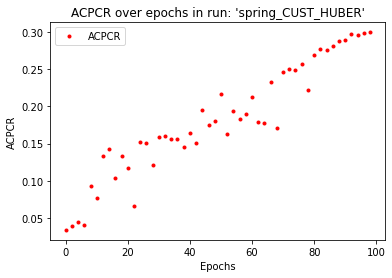

In [ ]:
fig, ax = plt.subplots()
ax.plot(acpcr_epochs[:,0],acpcr_epochs[:,1], '.', color='red', label='ACPCR')
ax.set_ylabel("ACPCR")
ax.set_title(f"ACPCR over epochs in run: '{Run}'")
ax.set_xlabel("Epochs")
plt.legend()
plt.savefig(Run + '_ACPCR.png')
plt.savefig(Run + '_ACPCR.jpeg')
plt.savefig(Run + '_ACPCR.pdf')

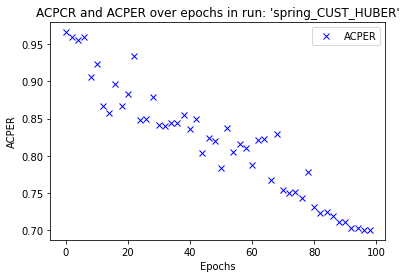

In [ ]:
fig, ax = plt.subplots()
ax.plot(acper_epochs[:,0],acper_epochs[:,1], 'x', color='blue', label='ACPER')
ax.set_ylabel("ACPER")
ax.set_title(f"ACPCR and ACPER over epochs in run: '{Run}'")
ax.set_xlabel("Epochs")
plt.legend()
plt.savefig(Run + '_ACPER.png')
plt.savefig(Run + '_ACPER.jpeg')
plt.savefig(Run + '_ACPER.pdf')

In [ ]:
np.savetxt(Run+'_ACPCR.txt', acpcr_epochs)
np.savetxt(Run+'_ACPER.txt', acper_epochs)

Let's save messages in files

In [ ]:
import pickle as pkl


pkl.dump(messages_over_time,
        open(Run + '_messages_over_time.pkl', 'wb'))
pkl.dump(recorded_models,
        open(Run + '_models_over_time.pkl', 'wb'))

## Analysis
Now let's analyze the functioning of the network with some plots

### Mean and Standard Deviation

The regularization term added to the loss favors a representation of the message vector in which the information is concentrated in the minimum number of entries possible, setting the others to zero. The initial idea to identify which components are actually relevant is to study their average value and observe which of these do not cancel out.

However this approach would not work, as the mean value of all interactions of a system without external forces would have to be really zero.
I studied the standard deviation of the individual components since the only entries that would result non-zero are those whose value changes from interaction to interaction, since the parameters on which this depends on the pairs of particles taken into consideration.

What I expect is that progressively during training the standard deviation of the entries decreases for most of them, ideally reaching a number of entries with non-zero variance equal to the physical dimension of the system in which the particles live ($D$). Although I haven't always managed to get this exact result, I have observed something very close to this process.

Mean of Messages Components (for Bottleneck is useless since the components are only 2). As expected, the mean goes to zero for all messages components.

In [ ]:
fig1, ax1 = plt.subplots(1,1)
cam = Camera(fig1)
t =  lambda _: tqdm(_)
for i in t(range(0, len(messages_over_time), 1)):
  msgs = copy(messages_over_time[i])
  msg_columns = ['e%d'%(k) for k in range(mod.msg_dim)]
  msg_array = np.array(msgs[msg_columns])
  msg_array = np.mean(msg_array, axis=0)

  plt.title(f"Mean of messages components")
  plt.xlabel("Messages Components")
  plt.ylabel("Mean")
  plt.scatter(range(len(msg_array)), msg_array, color='orange', marker=".")
  cam.snap()
plt.close()
ani = cam.animate()
HTML(ani.to_jshtml())

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:00<00:00, 171.70it/s]


Standar Deviation of Messages Components (for Bottleneck is useless since the components are only 2)

In [ ]:
fig1, ax1 = plt.subplots(1,1)
cam = Camera(fig1)
t =  lambda _: tqdm(_)
for i in t(range(0, len(messages_over_time), 1)):
  msgs = copy(messages_over_time[i])
  msg_columns = ['e%d'%(k) for k in range(mod.msg_dim)]
  msg_array = np.array(msgs[msg_columns])
  msg_array = np.std(msg_array, axis=0)

  plt.title(f"Standard Deviation of messages components")
  plt.xlabel("Messages Components")
  plt.ylabel("Std. Dev.")
  plt.scatter(range(len(msg_array)), msg_array, color='green', marker=".")
  cam.snap()
plt.close()
ani = cam.animate()
HTML(ani.to_jshtml())

100%|██████████| 100/100 [00:00<00:00, 149.49it/s]


Standard Deviation of all messages per Epoch.

Thanks to this plot it's possible to see that Standard Deviation over epochs at a certain point tend to an asymptotic behaviour (slightly decreasing). It means that most of messages components had sufficient time to go to zero, and it means that the number of epochs choosen is big enough.

100%|██████████| 100/100 [00:00<00:00, 226.91it/s]


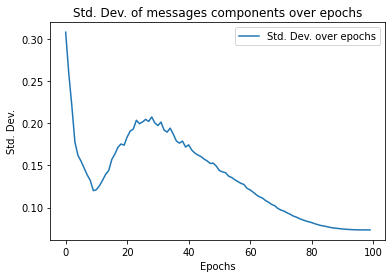

In [ ]:
fig, ax = plt.subplots(1,1)
t =  lambda _: tqdm(_)
plt.title(f"Std. Dev. of messages components over epochs")
plt.xlabel("Epochs")
plt.ylabel("Std. Dev.")
msg_std = []
for i in t(range(0, len(messages_over_time))):
  msgs = copy(messages_over_time[i])
  msg_col = ['e%d'%(k) for k in range(mod.msg_dim)]
  msg_array= np.array(msgs[msg_col])
  msg_std.append(np.std(msg_array))
ax.plot(range(len(messages_over_time)), msg_std, label="Std. Dev. over epochs")
plt.legend()
plt.savefig(Run + '_std.png')
plt.savefig(Run + '_std.jpeg')
plt.savefig(Run + '_std.pdf')

It is then possible to go back to physical forces. Calling $m_1$ and $m_2$ the most relevant components of the message, it is possible to decompose them as a linear combination of the physical force components $F_x$ and $F_y$, as $m_{i} = α_{i, \ x} F_x + α_{i, \ y} F_y + α_{i, \ bias}$

To do this, let's rearrange the components in order of importance, evaluated by the Standard Deviation from the mean value across all edges( for the KL model, I considered the feature with the
largest KL-divergence).

Verification is done by calculating the physical force from the simulation parameters and performing a linear fit for the messages.

In [ ]:
fig, ax = plt.subplots(1, dim, figsize=(4*dim, 4))
cam = Camera(fig)


for i in t(range(0, len(messages_over_time), 1)):
  msgs = copy(messages_over_time[i])

  msgs['bd'] = msgs.r + 1e-2
  msg_columns = ['e%d'%(k) for k in range(mod.msg_dim)]
  msg_array = np.array(msgs[msg_columns])
  msg_importance = msg_array.std(axis=0)

  # Here indexes of most important features are saved
  most_important = np.argsort(msg_importance)[-dim:]
  msgs_to_compare = msg_array[:, most_important]

  # Let's take the two relevant features of each message for each edge, renormalized with respect to the mean:
  msgs_to_compare = (msgs_to_compare - np.average(msgs_to_compare, axis=0)) / np.std(msgs_to_compare, axis=0)

  # Now the force is computed from the simulation data
  pos_cols = ['dx', 'dy']
  if dim == 3:
    pos_cols.append('dz')


  if sim == 'spring':
    force_fnc = lambda msg: -(np.array(msg.bd) - 1)[:, None] * np.array(msg[pos_cols]) / np.array(msg.bd)[:, None]
    # -grad(U) = -(r-1)*(x,y)/r

  elif sim == 'r1':
    force_fnc = lambda msg: np.array(msgs.m1)[:, None] * np.array(msgs.m2)[:, None] * np.array(msg[pos_cols]) / (np.array(msg.bd)[:, None] ** 2)
    # -grad(U) = m1*m2*(x,y)/r^2

  elif sim == 'r2':
    force_fnc = lambda msg: -2 * np.array(msgs.m1)[:, None] * np.array(msgs.m2)[:, None] * np.array(msg[pos_cols]) / (np.array(msg.bd)[:, None] ** 3)
    # -grad(U) = m1*m2*(x,y)/r^3

  elif sim == 'charge':
    force_fnc = lambda msg: -np.array(msgs.q1)[:, None] * np.array(msgs.q2)[:, None] * np.array(msg[pos_cols]) / (np.array(msg.bd)[:, None] ** 3)
    # -grad(U) = m1*m2*(x,y)/r^3


  expected_forces = force_fnc(msgs)

  def percentile_sum(x):
    x = x.ravel()
    bot = x.min()
    top = np.percentile(x, 90)
    msk = (x>=bot) & (x<=top)
    frac_good = (msk).sum()/len(x)
    return x[msk].sum()/frac_good

  def linear_transformation_2d(alpha):

      lincomb1 = (alpha[0] * expected_forces[:, 0] + alpha[1] * expected_forces[:, 1]) + alpha[2]
      lincomb2 = (alpha[3] * expected_forces[:, 0] + alpha[4] * expected_forces[:, 1]) + alpha[5]

      score = (
          percentile_sum(np.square(msgs_to_compare[:, 0] - lincomb1)) +
          percentile_sum(np.square(msgs_to_compare[:, 1] - lincomb2))
      )/2.0

      return score

  def out_linear_transformation_2d(alpha):
      lincomb1 = (alpha[0] * expected_forces[:, 0] + alpha[1] * expected_forces[:, 1]) + alpha[2]
      lincomb2 = (alpha[3] * expected_forces[:, 0] + alpha[4] * expected_forces[:, 1]) + alpha[5]

      return lincomb1, lincomb2

  def linear_transformation_3d(alpha):

      lincomb1 = (alpha[0] * expected_forces[:, 0] + alpha[1] * expected_forces[:, 1] + alpha[2] * expected_forces[:, 2]) + alpha[3]
      lincomb2 = (alpha[0+4] * expected_forces[:, 0] + alpha[1+4] * expected_forces[:, 1] + alpha[2+4] * expected_forces[:, 2]) + alpha[3+4]
      lincomb3 = (alpha[0+8] * expected_forces[:, 0] + alpha[1+8] * expected_forces[:, 1] + alpha[2+8] * expected_forces[:, 2]) + alpha[3+8]

      score = (
          percentile_sum(np.square(msgs_to_compare[:, 0] - lincomb1)) +
          percentile_sum(np.square(msgs_to_compare[:, 1] - lincomb2)) +
          percentile_sum(np.square(msgs_to_compare[:, 2] - lincomb3))
      )/3.0

      return score

  def out_linear_transformation_3d(alpha):

      lincomb1 = (alpha[0] * expected_forces[:, 0] + alpha[1] * expected_forces[:, 1] + alpha[2] * expected_forces[:, 2]) + alpha[3]
      lincomb2 = (alpha[0+4] * expected_forces[:, 0] + alpha[1+4] * expected_forces[:, 1] + alpha[2+4] * expected_forces[:, 2]) + alpha[3+4]
      lincomb3 = (alpha[0+8] * expected_forces[:, 0] + alpha[1+8] * expected_forces[:, 1] + alpha[2+8] * expected_forces[:, 2]) + alpha[3+8]

      return lincomb1, lincomb2, lincomb3

  if dim == 2:
      min_result = minimize(linear_transformation_2d, np.ones(dim**2 + dim), method='Powell')
  if dim == 3:
      min_result = minimize(linear_transformation_3d, np.ones(dim**2 + dim), method='Powell')
  print(title, mod.model_type, 'gets', min_result.fun/len(msgs))

  for j in range(dim):
    if dim == 3:
        px = out_linear_transformation_3d(min_result.x)[j]
    else:
        px = out_linear_transformation_2d(min_result.x)[j]

    py = msgs_to_compare[:, j]
    ax[j].scatter(px, py,
                  alpha=0.1, s=0.1, color='k')
    ax[j].set_xlabel('Linear combination of forces')
    ax[j].set_ylabel('Message Element %d'%(i+1))

    xlim = np.array([np.percentile(px, q) for q in [10, 90]])
    ylim = np.array([np.percentile(py, q) for q in [10, 90]])
    xlim[0], xlim[1] = xlim[0] - (xlim[1] - xlim[0])*0.05, xlim[1] + (xlim[1] - xlim[0])*0.05
    ylim[0], ylim[1] = ylim[0] - (ylim[1] - ylim[0])*0.05, ylim[1] + (ylim[1] - ylim[0])*0.05

    ax[j].set_xlim(xlim)
    ax[j].set_ylim(ylim)

  plt.tight_layout()

  cam.snap()
plt.close()
ani = cam.animate()
HTML(ani.to_jshtml())


  0%|          | 0/100 [00:00<?, ?it/s]

  2%|▏         | 2/100 [00:00<00:14,  6.97it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.4559316677517361
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.49846351906105324


  4%|▍         | 4/100 [00:00<00:13,  7.11it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.5353729021990741
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.5524907995153356


  6%|▌         | 6/100 [00:00<00:13,  7.12it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.575205394603588
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.6007916259765625


  8%|▊         | 8/100 [00:01<00:13,  6.97it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.3909347703721788
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.3902873625578704


  9%|▉         | 9/100 [00:01<00:13,  6.80it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.38317520141601563
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.36889452898943864


 11%|█         | 11/100 [00:01<00:14,  5.97it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.3522671197961878
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.32886252509223085


 13%|█▎        | 13/100 [00:02<00:15,  5.52it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.040777610496238424


 14%|█▍        | 14/100 [00:02<00:16,  5.16it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.03986785888671875


 15%|█▌        | 15/100 [00:02<00:16,  5.08it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.043251879656756365
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.04249921445493345


 17%|█▋        | 17/100 [00:02<00:16,  5.08it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.04455562732837817
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.042293548583984375


 19%|█▉        | 19/100 [00:03<00:15,  5.13it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.03900920585349754
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.03794412118417245


 21%|██        | 21/100 [00:03<00:15,  4.97it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.033747066921657985


 22%|██▏       | 22/100 [00:03<00:15,  4.89it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.034142497027361836
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.037280383639865446


 24%|██▍       | 24/100 [00:04<00:15,  4.99it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.035139907554343895
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.028697153727213542


 26%|██▌       | 26/100 [00:04<00:14,  5.05it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02735171424018012


 28%|██▊       | 28/100 [00:05<00:13,  5.43it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02783357549596716
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02803547188087746


 29%|██▉       | 29/100 [00:05<00:13,  5.16it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.027980753580729167
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.029767433449074076


 31%|███       | 31/100 [00:05<00:13,  5.15it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02709833498354311
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02879498799641927


 33%|███▎      | 33/100 [00:06<00:13,  5.09it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02722879339147497
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02797956113462095


 35%|███▌      | 35/100 [00:06<00:12,  5.15it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02815752665201823


 36%|███▌      | 36/100 [00:06<00:12,  4.96it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02882831714771412
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.028372565375434027


 38%|███▊      | 38/100 [00:06<00:12,  5.14it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.028394316214102284
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02845317558006004


 40%|████      | 40/100 [00:07<00:11,  5.20it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.028723739341453267
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02849944079363788


 42%|████▏     | 42/100 [00:07<00:10,  5.34it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.028333926730685764
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.027560201574254917


 44%|████▍     | 44/100 [00:08<00:10,  5.16it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.027863510979546438
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02722908585159867


 46%|████▌     | 46/100 [00:08<00:10,  5.16it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.027322037308304396
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02695813496907552


 48%|████▊     | 48/100 [00:08<00:10,  5.11it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.027168553670247397


 49%|████▉     | 49/100 [00:09<00:10,  5.00it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.026082598368326822
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.026461322925708915


 51%|█████     | 51/100 [00:09<00:09,  4.92it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.026296621251989293


 52%|█████▏    | 52/100 [00:09<00:09,  4.94it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.0261271314267759
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.025896818372938366


 54%|█████▍    | 54/100 [00:10<00:09,  4.74it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.025178061591254342
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02462214010733145


 56%|█████▌    | 56/100 [00:10<00:09,  4.86it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.025078952930591727


 57%|█████▋    | 57/100 [00:10<00:08,  4.80it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.024718312157524954


 58%|█████▊    | 58/100 [00:11<00:08,  4.79it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.024094862761320893


 59%|█████▉    | 59/100 [00:11<00:08,  4.77it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02346932799727828
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.023572527567545572


 61%|██████    | 61/100 [00:11<00:07,  4.91it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.023671839678729024
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02297149234347873


 63%|██████▎   | 63/100 [00:12<00:07,  4.87it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.023217093856246384


 64%|██████▍   | 64/100 [00:12<00:07,  4.58it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.022823014435944734


 65%|██████▌   | 65/100 [00:12<00:07,  4.63it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.023073136364972147


 66%|██████▌   | 66/100 [00:12<00:07,  4.69it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02237179650200738
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.022173962063259552


 68%|██████▊   | 68/100 [00:13<00:06,  4.79it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.022064675225151906


 69%|██████▉   | 69/100 [00:13<00:06,  4.82it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.021870512785734954


 70%|███████   | 70/100 [00:13<00:06,  4.87it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.022032634593822337


 71%|███████   | 71/100 [00:13<00:06,  4.68it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02203387083830657
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02157288869222005


 73%|███████▎  | 73/100 [00:14<00:05,  4.75it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.0215408847950123


 74%|███████▍  | 74/100 [00:14<00:05,  4.70it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.021356483742042826
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02126906854135019


 76%|███████▌  | 76/100 [00:14<00:05,  4.70it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.0211781989203559
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020957795602303965


 78%|███████▊  | 78/100 [00:15<00:04,  4.87it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.021120225411874277
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.021085642355459705


 80%|████████  | 80/100 [00:15<00:04,  4.90it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020789475617585356


 81%|████████  | 81/100 [00:15<00:03,  4.80it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020716206585919415


 82%|████████▏ | 82/100 [00:16<00:03,  4.72it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020735224971064815


 83%|████████▎ | 83/100 [00:16<00:03,  4.74it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020752610100640192


 84%|████████▍ | 84/100 [00:16<00:03,  4.77it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020657362054895472


 85%|████████▌ | 85/100 [00:16<00:03,  4.70it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020667300754123263


 86%|████████▌ | 86/100 [00:16<00:02,  4.73it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020410253736707896
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020550494017424405


 88%|████████▊ | 88/100 [00:17<00:02,  4.76it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020485654053864655


 89%|████████▉ | 89/100 [00:17<00:02,  4.75it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020567007418032045


 90%|█████████ | 90/100 [00:17<00:02,  4.66it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02038900304723669
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020548427723072193


 92%|█████████▏| 92/100 [00:18<00:01,  4.86it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02046815024481879


 93%|█████████▎| 93/100 [00:18<00:01,  4.88it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020432763276276765


 94%|█████████▍| 94/100 [00:18<00:01,  4.82it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020492300104211877


 95%|█████████▌| 95/100 [00:18<00:01,  4.72it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020445625870316116


 96%|█████████▌| 96/100 [00:18<00:00,  4.68it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.020428743715639467


 97%|█████████▋| 97/100 [00:19<00:00,  4.74it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02043267709237558


 98%|█████████▊| 98/100 [00:19<00:00,  4.75it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.0204391317014341
spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02045072626184534


100%|██████████| 100/100 [00:19<00:00,  5.05it/s]

spring_n=4_dim=2_nt=1000_dt=0.01 CUST gets 0.02045710669623481


Here it's possible to see the grayscale animation of the message components over time (for Bottleneck is unuseful since the message components are only 2)

In [ ]:
fig2, ax2 = plt.subplots(1,1)
cam2 = Camera(fig2)

for i in t(range(0, len(messages_over_time), 1)):
  msgs = copy(messages_over_time[i])
  msg_columns = ['e%d'%(k) for k in range(mod.msg_dim)]
  msg_array = np.array(msgs[msg_columns])
  msg_importance = msg_array.std(axis=0)
  ax2.pcolormesh(msg_importance[np.argsort(msg_importance)[::-1][None, :15]], cmap='gray_r', edgecolors='k')
  plt.axis('off')
  plt.grid(False)
  ax2.set_aspect('equal')
  plt.text(15.5, 0.5, '...', fontsize=30)
  fig2.suptitle(title + mod.model_type + 'mse=%.3e'%(min_result.fun/len(msgs),))
  plt.tight_layout()
  cam2.snap()
plt.close()
ani = cam2.animate()
HTML(ani.to_jshtml())

100%|██████████| 100/100 [00:01<00:00, 65.21it/s]


Now it's possible visualize what kind of rotation must be done to get back to the forces in Cartesian coordinates.

The plot shows the unit vectors $\hat{\alpha}_{1,2}$. The fact that the $D$ components of the message can be decomposable in the projections on the forces is in itself a confirmation that most of the information is contained in them.

To do this operation, we must know the analytical form of the force, that we can take from the PySR library.

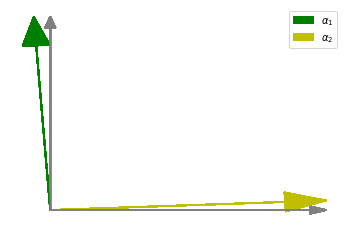

In [ ]:
import matplotlib.patches as mpatches
fig3, ax3 = plt.subplots(1, 1)
last_alpha_x1 = 0.0
last_alpha_y1 = 0.0
t = lambda _: _#tqdm
for i in t(range(0, len(messages_over_time), 1)):
    q = min_result.x
    alphax1, alphay1, offset1 = q[:3]
    alphax2, alphay2, offset2 = q[3:]

    s1 = alphax1**2 + alphay1**2
    s2 = alphax2**2 + alphay2**2

    if ((alphax2 - last_alpha_x1)**2 + (alphay2 - last_alpha_y1)**2 < (alphax1 - last_alpha_x1)**2 + (alphay1 - last_alpha_y1)**2):
      alphax1, alphay1, offset1 = q[3:]
      alphax2, alphay2, offset2 = q[:3]

    last_alpha_x1 = alphax1
    last_alpha_y1 = alphay1
    s1 = alphax1**2 + alphay1**2
    s2 = alphax2**2 + alphay2**2
    alphax1 /= s1**0.5 * 2
    alphay1 /= s1**0.5 * 2
    alphax2 /= s2**0.5 * 2
    alphay2 /= s2**0.5 * 2

    ax3.arrow(0.5, 0.5, alphax1, alphay1, color='g', head_width=0.05, length_includes_head=True)
    ax3.arrow(0.5, 0.5, alphax2, alphay2, color='y', head_width=0.05, length_includes_head=True)

    ax3.arrow(0.5, 0.5, 0.5,0, color='grey', head_width=0.02, length_includes_head=True)
    ax3.arrow(0.5, 0.5, 0,0.5, color='grey', head_width=0.02, length_includes_head=True)
    ax3.axis('off')

green_patch = mpatches.Patch(color='g', label=r'$\alpha_1$')
yellow_patch = mpatches.Patch(color='y', label=r'$\alpha_2$')
plt.legend(handles=[green_patch, yellow_patch])
plt.savefig(Run + '_rotation.png')
plt.savefig(Run + '_rotation.jpeg')
plt.savefig(Run + '_rotation.pdf')

## Plot predicted vs True trajectories

Let's try to reconstruct the trajectories of the particles integrating the motion with the acceleration obtained from the model and comparing it with the simulated trajectories.

In [ ]:
from simulate import make_transparent_color

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
camera = Camera(fig)

for current_model in range(0,len(recorded_models),int(len(recorded_models)/3)):
    i = 4
    if current_model > len(recorded_models):
        continue

    #Truth:
    cutoff_time = 300
    times = np.array(s.times)[:cutoff_time]
    x_times = np.array(data[i, :cutoff_time])
    masses = x_times[:, :, -1]
    length_of_tail = 75

    #Learned:
    e = edge_index.cuda()
    ogn.cpu()
    if current_model > -1:
        ogn.load_state_dict(recorded_models[current_model])
    else:
        # Random model!
        ogn = OGN(mod.n_f, mod.msg_dim, mod.dim, dt=0.1, hidden=mod.hidden_dim, edge_index=get_edge_index(n, sim), aggr=mod.aggr).cuda()
    ogn.cuda()

    def odefunc(y, t=None):
        y = y.reshape(4, 6).astype(np.float32)
        cur = Data(
            x=torch.from_numpy(y).cuda(),
            edge_index=e
        )

        dx = y[:, 2:4]
        dv = ogn.just_derivative(cur).cpu().detach().numpy()
        dother = np.zeros_like(dx)
        return np.concatenate((dx, dv, dother), axis=1).ravel()

    datai = odeint(odefunc, (np.asarray(x_times[0]).ravel()), times).reshape(-1, 4, 6)
    x_times2 = np.array(datai)

    d_idx = 10
    for t_idx in range(d_idx, cutoff_time, d_idx):
        start = max([0, t_idx-length_of_tail])
        ctimes = times[start:t_idx]
        cx_times = x_times[start:t_idx]
        cx_times2 = x_times2[start:t_idx]
        for j in range(n):
            rgba = make_transparent_color(len(ctimes), j/n)
            ax[0].scatter(cx_times[:, j, 0], cx_times[:, j, 1], s=1, color=rgba)
            ax[1].scatter(cx_times2[:, j, 0], cx_times2[:, j, 1], s=1, color=rgba)
            black_rgba = rgba
            black_rgba[:, :3] = 0.75
            ax[1].scatter(cx_times[:, j, 0], cx_times[:, j, 1], s=1, color=black_rgba, zorder=-1)

        for k in range(2):
            ax[k].set_xlim(-1, 3)
            ax[k].set_ylim(-3, 1)
        plt.tight_layout()
        camera.snap()


plt.close()
HTML(camera.animate().to_jshtml())

# Symbolic Regression

After training the network on the data and analyzing the result, let's exploit the physical considerations made on the most significant message to obtain an explicit form of the interaction between two nodes. To do this it's possible to use the symbolic regression method within the PySR package.

'best_message' is the message I'll study, the one with the best validation loss.

In [ ]:
best_message = np.argmax([np.std(messages_over_time[int(best_val)]['e%d'%(i,)]) for i in range(mod.msg_dim)])
messages_over_time[int(best_val)][['e%d'%(best_message,), 'dx', 'dy', 'r', 'm1', 'm2']]

,e62,dx,dy,r,m1,m2
0,-0.030433,0.919987,0.281933,0.962217,5.785905,0.836671
1,-0.423105,1.512071,1.784163,2.338717,5.785905,0.770745
2,0.179003,1.410453,-0.649252,1.552709,5.785905,0.800204
3,-0.012677,-0.919987,-0.281933,0.962217,0.836671,5.785905
4,-0.444376,0.592084,1.502230,1.614701,0.836671,0.770745
...,...,...,...,...,...,...
11995,-0.288716,0.433298,-0.436672,0.615166,1.684291,3.957689
11996,-0.225334,-0.467626,1.289654,1.371817,1.684291,0.415826
11997,0.617344,-0.620728,-1.564307,1.682961,0.415826,0.464730
11998,0.856324,0.900923,-1.726326,1.947271,0.415826,3.957689


## PySR and Julia

[PySR and Julia](https://github.com/MilesCranmer/PySR)
[PySR demo](https://colab.research.google.com/github/MilesCranmer/PySR/blob/master/examples/pysr_demo.ipynb)

PySR is a symbolic regression algorithm written in the Julia environment and uses regularized evolution, simulated annealing and gradient free optimization to find the best function that approximates the data. The output messages of the first MLP related to all particle pairs of all simulations are passed to PySR and fitted.

Unlike of a normal regressor that given a specific function looks for the best parameters, this algorithm starting from a set of operators algebraic and finite parameter, identifies which combination of them best represents the data. So it constructs a function starting from nothing.

For this it is essential that the inductive bias is able to force the representation correctly. Indeed, as far as PySR can be performant if the data is wrong, we will never get the correct analytic expression.

In [ ]:
import pysr
from pysr import PySRRegressor
if RunColab == True:
    pysr.install(precompile=False)  # Don't precompile in colab because compiled modules are incompatible static Python libraries:
else:
    pysr.install()

#It could take some time to install

/home/bernardo/.local/lib/python3.10/site-packages/pysr/julia_helpers.py:149: UserWarning: `torch` was loaded before the Julia instance started. This may cause a segfault when running `PySRRegressor.fit`. To avoid this, please run `pysr.julia_helpers.init_julia()` *before* importing `torch`. For updates, see https://github.com/pytorch/pytorch/issues/78829
  warnings.warn(


Julia Version 1.9.1
Commit 147bdf428cd (2023-06-07 08:27 UTC)
Platform Info:
  OS: Linux (x86_64-linux-gnu)
      Ubuntu 22.04.2 LTS
  uname: Linux 5.19.0-45-generic #46~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Wed Jun 7 15:06:04 UTC 20 x86_64 x86_64
  CPU: AMD Ryzen 7 5800H with Radeon Graphics: 
                 speed         user         nice          sys         idle          irq
       #1-16  4021 MHz     316480 s        190 s      43568 s    3863949 s          0 s
  Memory: 13.496692657470703 GB (1659.19921875 MB free)
  Uptime: 26665.46 sec
  Load Avg:  4.68  7.71  7.07
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, znver3)
  Threads: 1 on 16 virtual cores
Environment:
  JULIA_PROJECT = @pysr-0.14.2
  MATHEMATICA_HOME = /usr/local/Wolfram/Mathematica/13.0
  HOME = /home/bernardo
  SNAP_LIBRARY_PATH = /var/lib/snapd/lib/gl:/var/lib/snapd/lib/gl32:/var/lib/snapd/void
  MANDATORY_PATH = /usr/share/gconf/ubuntu.mandatory.path
  DEFAULTS_PATH = /usr/share/gconf/ubuntu.

[ Info: Julia version info
[ Info: Julia executable: /snap/julia/80/bin/julia
[ Info: Trying to import PyCall...
┌ Info: PyCall is already installed and compatible with Python executable.
│ 
│ PyCall:
│     python: /bin/python3
│     libpython: /usr/lib/x86_64-linux-gnu/libpython3.10.so.1.0
│ Python:
│     python: /bin/python3
└     libpython: 
    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`
/home/bernardo/.local/lib/python3.10/site-packages/pysr/julia_helpers.py:105: UserWarning: It is recommended to restart Python after installing PySR's dependencies, so that the Julia environment is properly initialized.
  warnings.warn(


To find the best function PySR uses processes similar to those of natural selection ("genetic algorithms") competing various expressions and mutating them. At a population of functions is assigned a score or fitness depending on their ability to represent the dataset. The best individuals are then combined and mutated in an attempt to get a better version.

In genetic programming individuals are represented by binary trees and the "fitness" of each expression is defined in terms of simplicity (i.e. number of nodes in the tree) and data accuracy (MSE between expected and obtained data). One iteration of the search cycle of the best function can be schematized as follows:

- At first, a population of P randomly generated individuals is created;
- S trees among the P are chosen randomly, the best of these is called parent;
- From the parent a tree called child is built by mutation;
- The child is reinserted into the population if its fitness is better than that of the oldest member.

Since theoretically the function made by PySR has no limit on the number of terms it can contain, the risk of overfitting is very high. To overcome this problem, the best function is identified through a score.

## Model to use in PySR

Let's define the model to use by assigning the operators to search for and the number of iterations to repeat in an attempt to find the best function.
We assigned the minimum number of operators to use specific to the type of interaction I'm looking in ordr to have greater efficiency on the specific problem.

In [ ]:
default_pysr_params = dict(
    populations=30,
    model_selection="best",   #selects the candidate model with the highest score among expressions with a loss better than at least 1.5x the most accurate model.
)

model_pysr = PySRRegressor(
    niterations= 30,
    binary_operators=["plus", "sub", "mult", "div"],
    unary_operators=["cube", "square"],
    **default_pysr_params
)

In [ ]:
x = messages_over_time[int(best_val)][['dx', 'dy', 'r', 'm1', 'm2']] # Fit Parameters
y = messages_over_time[int(best_val)][['e%d'%(best_message,)]] #Values that I want to approximate with the function

model_pysr.fit(x,y)

/home/bernardo/.local/lib/python3.10/site-packages/pysr/sr.py:1296: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/home/bernardo/.local/lib/python3.10/site-packages/pysr/sr.py:1364: FutureWarning: Index.is_object is deprecated.Use pandas.api.types.is_object_dtype instead
  if X.columns.is_object() and X.columns.str.contains(" ").any():
/home/bernardo/.local/lib/python3.10/site-packages/pysr/sr.py:1796: UserWarning: Note: you are running with more than 10,000 datapoints. You should consider turning on batching (https://astroautomata.com/PySR/options/#batching). You should also reconsider if you need that many datapoints. Unless you have a large amount of noise (in which case you should smooth your dataset first), generally < 10,000 datapoints is enough to find a functional form with symbolic regression. More datapoints will lower the search speed.
  warnings.warn(


Compiling Julia backend...


/home/bernardo/.local/lib/python3.10/site-packages/pysr/julia_helpers.py:218: UserWarning: Julia has already started. The new Julia options {'threads': 16} will be ignored.
  warnings.warn(


Note: you are running with more than 10,000 datapoints. You should consider turning on batching (`options.batching`), and also if you need that many datapoints. Unless you have a large amount of noise (in which case you should smooth your dataset first), generally < 10,000 datapoints is enough to find a functional form.
Started!

Expressions evaluated per second: 3.530e+04
Head worker occupation: 10.1%
Progress: 82 / 900 total iterations (9.111%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
1           2.425e-01  3.072e-06  0.008819702
2           2.425e-01  4.767e-07  square(0.09307254)
3           7.647e-02  1.154e+00  (-0.34533817 * dy)
4           7.500e-02  1.948e-02  cube(-0.3955859 * dy)
5           4.296e-02  5.572e-01  (-0.17022116 * (dy * r))
7           4.121e-02  2.081e-02  ((-0.17022116 * (-0.1851725 + r)) * dy)
8           4.117e-02  8.167e-04  ((-0.17359407 * (r

PySRRegressor.equations_ = [
	    pick         score                                           equation   
	0         0.000000e+00                                        0.008662779  \
	1         1.237179e-07                                 square(0.09307254)   
	2         1.154134e+00                                 (-0.34305963 * dy)   
	3         2.111644e-02                             cube(-0.39929792 * dy)   
	4         5.789549e-01                           (-0.15897897 * (dy * r))   
	5         3.685292e-01            (((0.74224573 / r) + -0.73722464) * dy)   
	6         2.811712e-03  (((0.74222916 / (r - -0.008200186)) + -0.73720...   
	7         1.934917e-04  (((0.74222916 / (r + square(0.11072067))) + -0...   
	8   >>>>  7.537619e-01  (-1.0681046 * (dy / ((m1 + r) / (r - 1.0392214...   
	9         2.819045e-02  (-1.0681046 * (dy / ((m1 + r) / ((r + -1.06810...   
	10        1.138754e-01  (-1.0681046 * (dy / ((r + m1) / ((r - (0.22501...   
	
	        loss  complexity  
	0   0.242487           1  
	1   0.242487           2  
	2   0.076464           3  
	3   0.074866           4  
	4   0.041961           5  
	5   0.020079           7  
	6   0.019967           9  
	7   0.019963          10  
	8   0.009394          11  
	9   0.008879          13  
	10  0.007071          15  
]

## Choosing best function to use

`model_selection="best"` selects the equation with the max score and prints it. But it is best to look through all the equations manually, select an equation above some MSE threshold, and then use the score to select among that loss threshold.

Here, "score" is defined by:
$$ \text{score} = - \log(\text{loss}_i/\text{loss}_{i-1})/
(\text{complexity}_i - \text{complexity}_{i-1})$$

In [ ]:
print('Function with best score:')
model_pysr.sympy()

Function with best score:


-1.0681046*dy*(r - 1.0392214)/(m1 + r)

In [ ]:
import pickle as pkl

pkl.dump(model_pysr.sympy, open(Run + '_best_score.pkl', 'wb'))

np.savetxt(Run+'_pysr_summary.txt', np.c_[model_pysr.equations_.loss, model_pysr.equations_.complexity,model_pysr.equations_.score])

/home/bernardo/.local/lib/python3.10/site-packages/pysr/sr.py:1079: UserWarning: raw_julia_state_ cannot be pickled and will be removed from the serialized instance. This will prevent a `warm_start` fit of any model that is deserialized via `pickle.load()`.
  warnings.warn(


# SOME CONCLUSIONS AND POSSIBLE IMPROVEMENTS



In general Bottleneck is the model that works better (with the same simulation and loss). It has ACPCR (lowest ACPER).

Instead training with KL model is definitely the worst.

Unexpected good results from PM. I implemented the model to see how much the training worsened by increasing the dimensionality of the layers, thus losing information. I expected to get much worse results.

CUST model doesn't work so well. I hoped that inverse transformations could improve the results, but it didn't happen.


In [2]:
from IPython import display
display.Image(url='https://github.com/BernardoRicci/symbolic_deep_learning/blob/master/images/ACPCR_HUBER.png?raw=true')

If we check at losses, HUBER loss and MAE are both good, instead MSE is the worst.
It is expected that the value of the MSE errors are higher than the MAE errors by something around the power of two, but I have higer loss. I think this is due to the fact that MSE amplify the higher errors more than the lower ones.

In [ ]:
display.Image(url='https://github.com/BernardoRicci/symbolic_deep_learning/blob/master/images/loss_r1_B.png?raw=true')

As you can see, MAE loss has the best ACPCR

In [3]:
display.Image(url='https://github.com/BernardoRicci/symbolic_deep_learning/blob/master/images/r1_B_Acpcr.png?raw=true')


In general, for the reconstruction of analytical functions, the best results are obtained with the Bottleneck model. This is because the model is able to extract the most relevant information from the messages. It's possible to see that simulations r2 and charge are notso good, they have low ACPCR and high training losses. Following plots are for Bottleneck and MAE loss

In [ ]:
display.Image(url='https://github.com/BernardoRicci/symbolic_deep_learning/blob/master/images/acpcr_simul.png?raw=true')

In [6]:
display.Image(url='https://github.com/BernardoRicci/symbolic_deep_learning/blob/master/images/loss_sim.png?raw=true')

Simulations r2 and charge doesn't gives good analytical results. It's not PySR fault, but the fact that the data is not good. The model is not able to extract the correct information from the messages. In fact, the ACPCR for these two simulations are very low respect to r1 and spring.


So some next steps possible to do are:
- Do longer trainings for r2 and charge simulations, to see if the model is able to extract the correct information from the messages;
- Try to use the model with more layers and more neurons, to see if the model is able to extract the correct information from the messages;
- Try different potentials, to see if it's possible to get results also for Physics beyond the Standard Model.